In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn import metrics
from numpy import float32 
import time
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import silhouette_score, calinski_harabasz_score

In [2]:
data=pd.read_csv("C:/Users/86183/BS/BS/denoised_spectra.csv")

In [3]:
print("Number of datapoints:", len(data))

data.head()

Number of datapoints: 149


,201.053,202.31900000000002,203.584,204.85,206.115,207.378,208.643,209.907,211.171,212.435,...,1990.23,1991.21,1992.19,1993.17,1994.15,1995.13,1996.11,1997.09,1998.07,1999.05
0,142.512995,65.576132,9.786255,-26.996452,-46.911803,-52.099615,-44.699703,-26.851882,-0.695967,31.628225,...,35.022263,32.725422,28.034033,19.802888,6.886778,-11.859506,-37.581172,-71.423431,-114.531490,-168.050559
1,110.928102,57.498172,21.494644,1.038475,-5.749375,-0.747947,14.163718,37.106580,66.201598,99.569730,...,45.873409,17.176017,-8.318725,-29.255584,-44.279326,-52.034715,-51.166517,-40.319497,-18.138422,16.731944
2,71.735616,18.586738,-14.781687,-30.602392,-31.108110,-18.531573,4.894486,36.937334,75.364239,117.942467,...,67.939502,46.721335,25.214159,3.813820,-17.083838,-37.082970,-55.787731,-72.802277,-87.730761,-100.177340
3,45.143295,8.980990,-13.698055,-24.290311,-24.192250,-14.800344,2.488935,26.279115,55.173725,87.776292,...,38.950320,13.295839,-10.475361,-31.426813,-48.622049,-61.124602,-67.998003,-68.305787,-61.111484,-45.478628
4,41.553095,-7.686351,-37.388624,-49.835375,-47.308252,-32.088908,-6.458992,27.299846,66.905955,110.077684,...,44.569848,16.213728,-10.343591,-33.585657,-51.996020,-64.058228,-68.255831,-63.072378,-46.991419,-18.496503


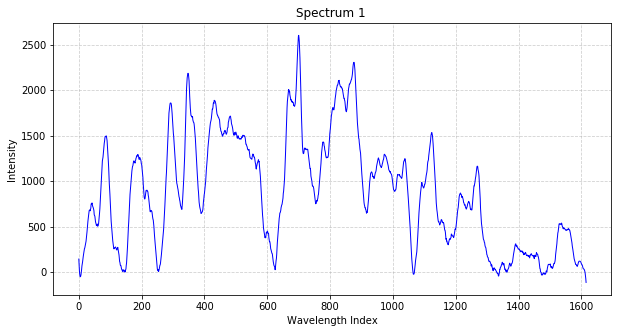

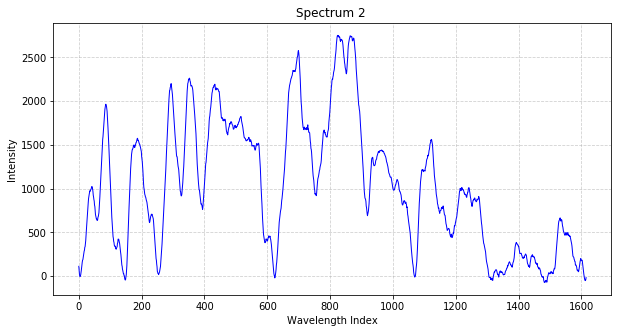

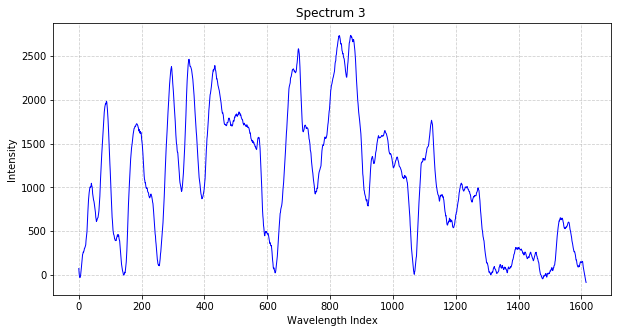

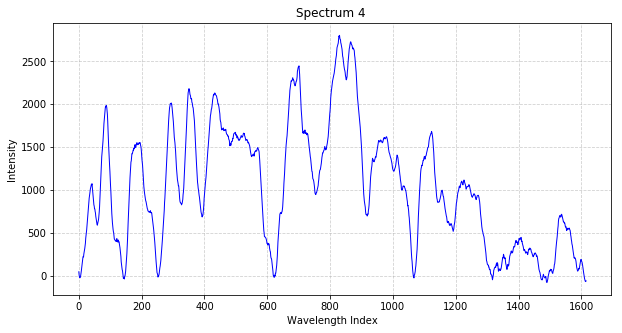

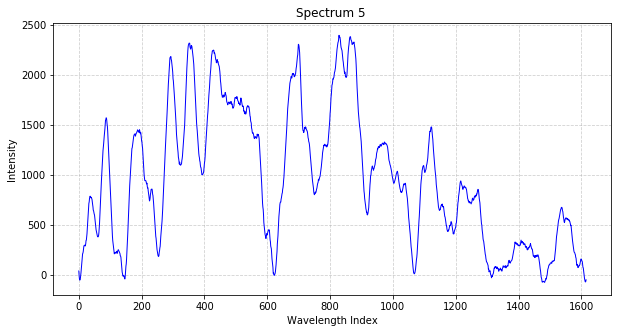

...

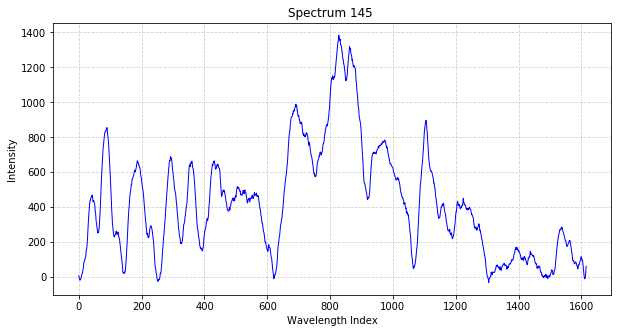

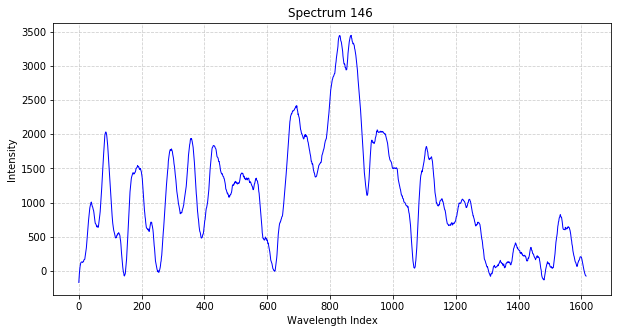

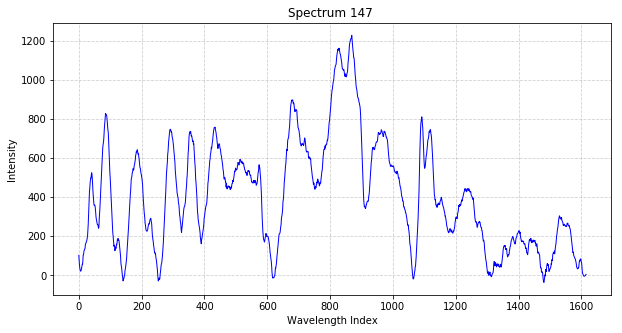

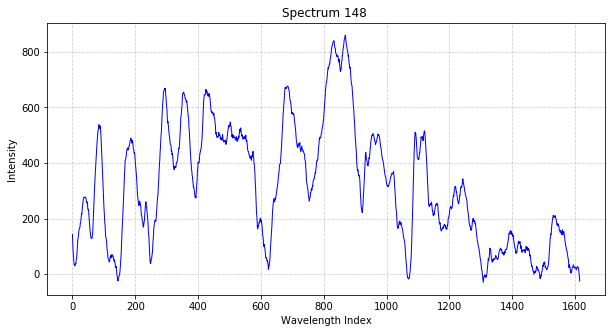

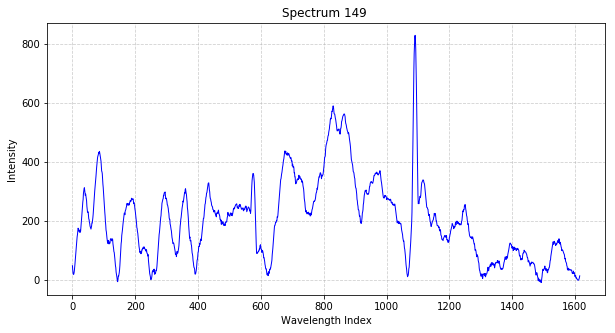

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# 读取CSV文件，第一行为列名（0到1601为光谱数据，最后一列为type标签）
df = pd.read_csv("C:/Users/86183/BS/BS/denoised_spectra.csv")

# 遍历每一行数据并绘制光谱图
for index, row in df.iterrows():
    # 提取光谱数据和标签
    spectrum = row.iloc[:-1].values.astype(float)  # 前1602列为光谱强度
                            # 最后一列为标签
    
    # 创建横轴（假设为波长索引）
    wavelength_index = range(len(spectrum))
    
    # 绘制光谱图
    plt.figure(figsize=(10, 5))
    plt.plot(wavelength_index, spectrum, color='blue', linewidth=1)
    plt.xlabel('Wavelength Index')
    plt.ylabel('Intensity')
    plt.title(f'Spectrum {index + 1} ')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

# 若需保存图像到文件，可替换为以下代码：
# for index, row in df.iterrows():
#     spectrum = row.iloc[:-1].values.astype(float)
#     label = row.iloc[-1]
#     wavelength_index = range(len(spectrum))
    
#     plt.figure(figsize=(10, 5))
#     plt.plot(wavelength_index, spectrum, color='blue', linewidth=1)
#     plt.xlabel('Wavelength Index')
#     plt.ylabel('Intensity')
#     plt.title(f'Spectrum {index + 1} (Type: {int(label)})')
#     plt.grid(True, linestyle='--', alpha=0.6)
#     plt.savefig(f'spectrum_{index + 1}.png')  # 保存为图片
#     plt.close()                               # 关闭图形，避免内存泄漏

In [5]:
from sklearn.preprocessing import StandardScaler
# 数据标准化
scaler = StandardScaler()
data = scaler.fit_transform(data)

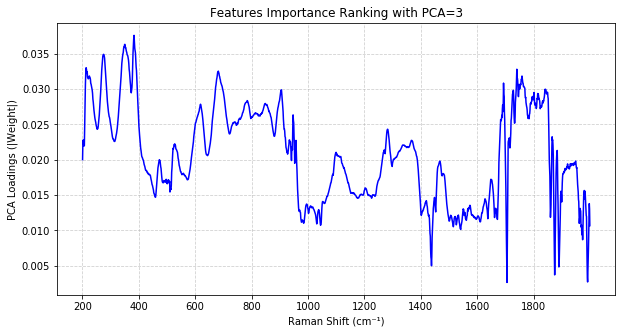

In [129]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# 1. 读取CSV文件第一行作为横坐标标签
header = pd.read_csv("C:/Users/86183/BS/BS/transposed_loss_output.csv", nrows=0).columns.tolist()  # 只读取标题行
x_labels = np.array(header, dtype=float)  # 假设是数值型标签

# 3. PCA分析（保留累积方差>99%的主成分）
pca = PCA(n_components=3)  # 自动选择主成分直到累积方差>99%
pca.fit(data)

# 4. 提取载荷（主成分的特征权重）
loadings = pca.components_.T  # 载荷矩阵，形状为(n_features, n_components)

# 5. 计算特征重要性（取绝对值并求平均）
feature_importance = np.abs(loadings).mean(axis=1)

# 6. 可视化
plt.figure(figsize=(10, 5))
plt.plot(x_labels, feature_importance, color='blue', linewidth=1.5)
plt.title("Features Importance Ranking with PCA=3")
plt.xlabel("Raman Shift (cm⁻¹)")
plt.ylabel("PCA Loadings (|Weight|)")
plt.xticks([200,400,600,800, 1000, 1200, 1400, 1600,1800])  # 设置刻度与用户图一致
plt.grid(linestyle='--', alpha=0.6)
plt.show()

特征值（Eigenvalues）： [1.11397966e+03 1.37552387e+02 7.14829839e+01 4.48857611e+01
 3.27938813e+01 2.72817292e+01 2.11493389e+01 1.89687394e+01
 1.30895192e+01 1.18057887e+01 9.53540337e+00 8.53270358e+00
 8.16082400e+00 7.22259507e+00 6.53639914e+00 6.16761648e+00
 5.71873137e+00 5.36806749e+00 4.68745394e+00 4.15452358e+00
 4.07287121e+00 3.73200519e+00 3.57165778e+00 3.40196089e+00
 3.19209381e+00 2.69584395e+00 2.61021196e+00 2.42053035e+00
 2.24887843e+00 2.12769101e+00 2.06319595e+00 1.85002886e+00
 1.63309260e+00 1.53677593e+00 1.42946261e+00 1.40868844e+00
 1.35513906e+00 1.23241969e+00 1.19685098e+00 1.15563949e+00
 1.04006083e+00 9.66447416e-01 9.45285760e-01 8.98123362e-01
 8.61157619e-01 8.36115691e-01 7.76255792e-01 7.49451394e-01
 6.88555697e-01 6.67047652e-01 6.41747580e-01 5.81670811e-01
 5.73481065e-01 5.45751621e-01 5.37540619e-01 4.93483063e-01
 4.70806381e-01 4.68927027e-01 4.40803861e-01 4.16193561e-01
 3.81144453e-01 3.72319213e-01 3.65435743e-01 3.51208794e-01
 3.206

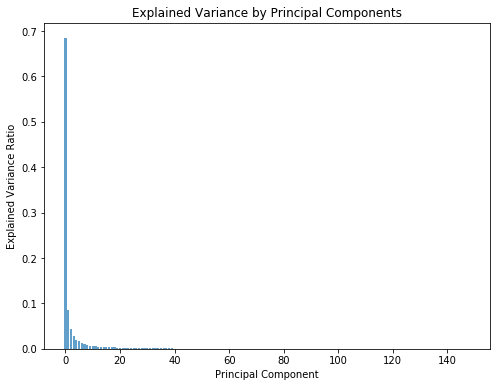

In [6]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 使用scikit-learn中的PCA类进行PCA
pca = PCA()
X_pca = pca.fit_transform(data)

# 获取特征值和特征向量
eigenvalues = pca.explained_variance_
eigenvectors = pca.components_

print("特征值（Eigenvalues）：", eigenvalues)
print("特征向量（Eigenvectors）：\n", eigenvectors)

# 解释方差比例
explained_variance_ratio = pca.explained_variance_ratio_
print("解释方差比例（Explained Variance Ratio）：", explained_variance_ratio)

# 可视化解释方差比例
plt.figure(figsize=(8, 6))
plt.bar(range(len(explained_variance_ratio)), explained_variance_ratio, alpha=0.7, align='center')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.show()


In [7]:
# 计算累计解释方差比例
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# 找到累计解释方差比例大于90%的成分数量
num_components = np.argmax(cumulative_variance_ratio >= 0.95) + 1
print("解释方差比例大于99%的成分数量：", num_components)


解释方差比例大于99%的成分数量： 18


In [8]:
cumulative_variance_ratio

array([0.68429393, 0.76878943, 0.8126999 , 0.84027226, 0.86041685,
       0.87717543, 0.89016702, 0.90181911, 0.90985972, 0.91711177,
       0.92296916, 0.92821062, 0.93322364, 0.93766032, 0.94167549,
       0.94546413, 0.94897702, 0.95227451, 0.95515392, 0.95770595,
       0.96020783, 0.96250032, 0.96469431, 0.96678407, 0.9687449 ,
       0.9704009 , 0.9720043 , 0.97349118, 0.97487262, 0.97617961,
       0.97744699, 0.97858342, 0.9795866 , 0.9805306 , 0.98140869,
       0.98227402, 0.98310645, 0.9838635 , 0.9845987 , 0.98530859,
       0.98594747, 0.98654114, 0.98712181, 0.98767351, 0.9882025 ,
       0.98871611, 0.98919295, 0.98965332, 0.99007628, 0.99048604,
       0.99088025, 0.99123756, 0.99158983, 0.99192508, 0.99225528,
       0.99255841, 0.99284762, 0.99313567, 0.99340645, 0.99366211,
       0.99389623, 0.99412494, 0.99434942, 0.99456516, 0.99476212,
       0.99495519, 0.99514102, 0.99532486, 0.99550733, 0.99567608,
       0.99584045, 0.99599586, 0.99614418, 0.99628482, 0.99641

In [9]:
# 1. 读取CSV文件第一行作为横坐标标签
header = pd.read_csv("C:/Users/86183/BS/BS/transposed_loss_output.csv", nrows=0).columns.tolist()  # 只读取标题行
x_labels = np.array(header, dtype=float)  # 假设是数值型标签

In [10]:
x_labels

array([ 201.053,  202.319,  203.584, ..., 1997.09 , 1998.07 , 1999.05 ])

In [11]:
pca = PCA(n_components=3)
pca.fit(data)
PCA_ds = pd.DataFrame(pca.transform(data), columns=range(3))
PCA_ds.describe().T
loadings = pca.components_.T 

<function matplotlib.pyplot.show(*args, **kw)>

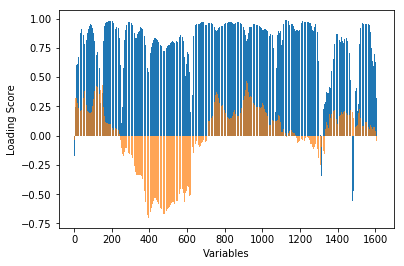

In [12]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
import matplotlib.pyplot as plt

plt.bar(range(len(loadings)), loadings[:,0],label='PC1')  # 第一主成分载荷
plt.bar(range(len(loadings)), loadings[:,1],label='PC2', alpha=0.7)  # 第一主成分载荷
#plt.bar(range(len(loadings)), loadings[:,2],label='PC3', alpha=0.5) 
plt.xlabel("Variables")
plt.ylabel("Loading Score")
plt.show

SyntaxError: positional argument follows keyword argument (<ipython-input-32-94f5f55a5b23>, line 22)

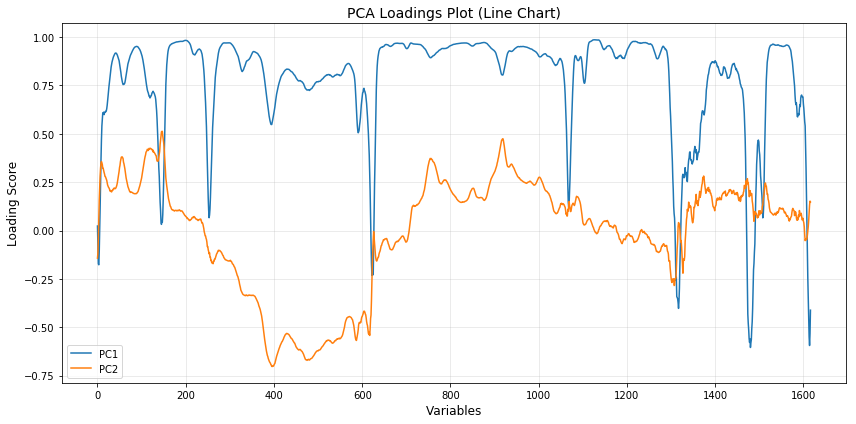

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# 假设已经计算了loadings矩阵
# loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

plt.figure(figsize=(12, 6))

# 绘制PC1和PC2的折线图
plt.plot(range(len(loadings)), loadings[:, 0],  label='PC1')
plt.plot(range(len(loadings)), loadings[:, 1], label='PC2')

# 可以添加更多主成分
# plt.plot(range(len(loadings)), loadings[:, 2],  label='PC3')

# 添加参考线
# plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.5)

# 设置坐标轴标签和标题
plt.xlabel("Variables", fontsize=12)
plt.ylabel("Loading Score", fontsize=12)
plt.title("PCA Loadings Plot (Line Chart)", fontsize=14)

# 设置x轴刻度为特征名称
# plt.xticks(range(len(loadings)), feature_names, rotation=45, ha='right')

# 添加图例和网格
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# 调整布局防止标签重叠
plt.tight_layout()
plt.show()


图片已保存至: PCA_variable.jpg


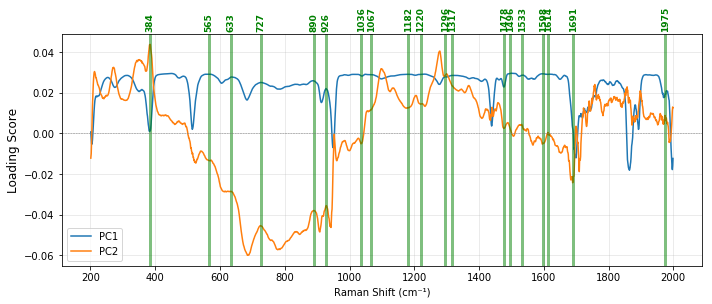

In [12]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 4))
plt.plot(x_labels, loadings[:, 0], label='PC1')
plt.plot(x_labels, loadings[:, 1], label='PC2')

# 在指定位置添加竖线
target_positions = [384,565,633,727,890,926, 1036, 1067, 1182, 1220, 1296, 1317, 1478, 1533, 1496, 1691, 1614, 1598,1975]
#target_positions = [430,560,1063,1476,1406,488,1330,1530,1619,1640,1064,807,1012,1183,1292,1591,1620]
for pos in target_positions:
    plt.axvline(x=pos, color='green', linestyle='-', 
                linewidth=3, alpha=0.5)
    
    # 竖排文字标注（关键修改点）
    plt.text(pos, plt.ylim()[1]*1.02, str(pos),
             ha='center', va='bottom', color='green',
             fontsize=9, weight='bold',
             rotation=90)  # 设置文字旋转90度:ml-citation{ref="4" data="citationList"}

# 图表格式化
plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.5)
plt.xlabel("Raman Shift (cm⁻¹)")
plt.ylabel("Loading Score", fontsize=12)
plt.xticks([200,400,600,800,1000,1200,1400,1600,1800,2000])
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# 扩大顶部边距容纳竖排文字
plt.subplots_adjust(top=0.85)  # 调整上边距:ml-citation{ref="7" data="citationList"}
plt.tight_layout()
#保存图片
save_path="PCA_variable.jpg"
plt.savefig(save_path, dpi=600, bbox_inches='tight')
print(f"图片已保存至: {save_path}")
plt.show()


In [49]:
import pandas as pd

# 假设loadings是二维numpy数组
df = pd.DataFrame(loadings[:, 0])  # 转换为DataFrame:ml-citation{ref="4" data="citationList"}
df.to_csv('loadings.csv', index=False, header=['PC2'])  # 保存为CSV:ml-citation{ref="3,6" data="citationList"}


共同波峰位置（索引）： [ 146  429  459  478  502  519  521  526  528  539  543  548  604  678
  680  827 1184 1219 1288 1343 1357 1372 1448 1479 1589 1599]
共同波峰位置（x坐标）： [ 383.543  724.737  759.97   782.193  810.166  829.913  832.234  838.028
  840.345  853.074  857.698  863.472  927.822 1011.95  1014.21  1178.3
 1561.51  1598.07  1669.54  1725.97  1740.26  1755.53  1832.36  1863.45
 1972.55  1982.37 ]


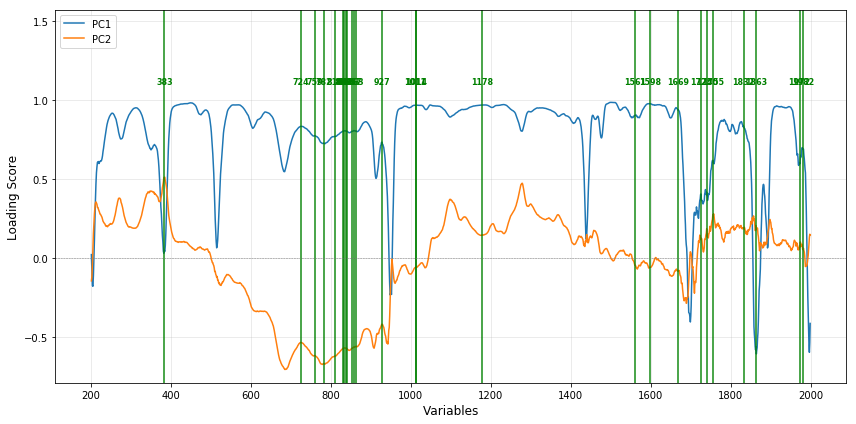

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import argrelextrema

# 假设loadings是已经计算好的载荷矩阵
# loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# 绘制PC1和PC2的折线图
plt.figure(figsize=(12, 6))
plt.plot(x_labels, loadings[:, 0], label='PC1')
plt.plot(x_labels, loadings[:, 1], label='PC2')

# 找出PC1和PC2波峰相同的位置（局部最大值）
pc1_peaks = argrelextrema(loadings[:, 0], np.greater)[0]
pc2_peaks = argrelextrema(loadings[:, 1], np.greater)[0]

# 找出两个载荷同时出现波峰的位置（取交集）
common_peaks = np.intersect1d(pc1_peaks, pc2_peaks)

# 打印共同波峰位置
print("共同波峰位置（索引）：", common_peaks)
print("共同波峰位置（x坐标）：", x_labels[common_peaks])

# 用绿色竖线标记共同波峰位置
for peak_idx in common_peaks:
    peak_x = x_labels[peak_idx]  # 获取对应的x坐标值
    plt.axvline(x=peak_x, color='green', linestyle='-', linewidth=2.0, alpha=0.7)
    # 在顶部添加标注
    plt.text(peak_x, max(loadings[:, 0].max(), loadings[:, 1].max())+0.1, 
             f'{int(peak_x)}', 
             ha='center', va='bottom', color='green', fontsize=8, weight='bold')

# 添加参考线
plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.5)

# 设置坐标轴标签和标题
plt.xlabel("Variables", fontsize=12)
plt.ylabel("Loading Score", fontsize=12)

# 设置x轴刻度
plt.xticks([200,400,600,800,1000,1200,1400,1600,1800,2000])

# 添加图例和网格
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# 调整y轴范围
ylim = plt.ylim()
plt.ylim(ylim[0], ylim[1] + 0.5)

# 调整布局防止标签重叠
plt.tight_layout()
plt.show()

<Figure size 432x288 with 0 Axes>

共同波峰位置（索引）： [ 146  429  459  478  502  519  521  526  528  539  543  548  604  678
  680  827 1184 1219 1288 1343 1357 1372 1448 1479 1589 1599]
共同波峰位置（x坐标）： [ 383.543  724.737  759.97   782.193  810.166  829.913  832.234  838.028
  840.345  853.074  857.698  863.472  927.822 1011.95  1014.21  1178.3
 1561.51  1598.07  1669.54  1725.97  1740.26  1755.53  1832.36  1863.45
 1972.55  1982.37 ]


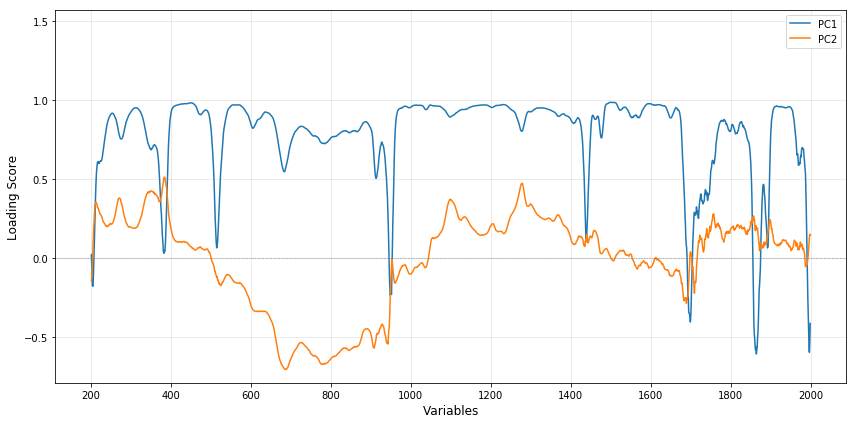

In [51]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import argrelextrema

# 假设loadings是已经计算好的载荷矩阵
# loadings = pca.components_.T * np.sqrt(pca.explained_variance_)


# 绘制PC1和PC2的折线图
plt.figure(figsize=(12, 6))
plt.plot(x_labels, loadings[:, 0], label='PC1')
plt.plot(x_labels, loadings[:, 1], label='PC2')

# 找出PC1和PC2波峰相同的位置（局部最大值）
pc1_peaks = argrelextrema(loadings[:, 0], np.greater)[0]
pc2_peaks = argrelextrema(loadings[:, 1], np.greater)[0]

# 找出两个载荷同时出现波峰的位置（取交集）
common_peaks = np.intersect1d(pc1_peaks, pc2_peaks)

# 打印共同波峰位置
print("共同波峰位置（索引）：", common_peaks)
print("共同波峰位置（x坐标）：", x_labels[common_peaks])

# 指定要保留的波峰位置
specific_peaks = [782, 829, 1561, 1598]

# 获取指定波峰位置在x_labels中的索引
specific_peak_indices = []
for peak in specific_peaks:
    idx = np.where(x_labels == peak)[0]
    if idx.size > 0:
        specific_peak_indices.append(idx[0])

# 用绿色竖线标记指定的波峰位置
for peak_idx in specific_peak_indices:
    peak_x = x_labels[peak_idx]  # 获取对应的x坐标值
    plt.axvline(x=peak_x, color='green', linestyle='-', linewidth=2.0, alpha=0.7)
    # 在顶部添加标注
    plt.text(peak_x, max(loadings[:, 0].max(), loadings[:, 1].max())+0.1, 
             f'{int(peak_x)}', 
             ha='center', va='bottom', color='green', fontsize=8, weight='bold')

# 添加参考线
plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.5)

# 设置坐标轴标签和标题
plt.xlabel("Variables", fontsize=12)
plt.ylabel("Loading Score", fontsize=12)

# 设置x轴刻度
plt.xticks([200,400,600,800,1000,1200,1400,1600,1800,2000])

# 添加图例和网格
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# 调整y轴范围
ylim = plt.ylim()
plt.ylim(ylim[0], ylim[1] + 0.5)

# 调整布局防止标签重叠
plt.tight_layout()
plt.show()

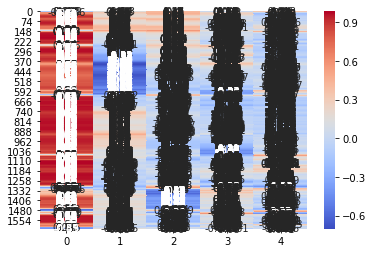

In [114]:
import seaborn as sns
sns.heatmap(loadings, annot=True, cmap='coolwarm')


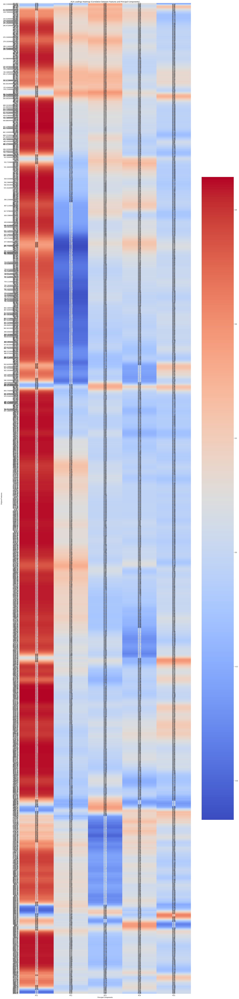

In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# 1. 准备数据（这里用随机数据作为示例）
np.random.seed(42)

feature_names = x_labels 
sample_names = [f'Sample_{i}' for i in range(149)]

# 2. 数据标准化（PCA前建议标准化）
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# 3. 执行PCA降维
pca = PCA(n_components=5)  # 降维到5个主成分
pca_result = pca.fit_transform(data)

# 4. 创建热图数据
# 计算主成分与原始特征的相关性（载荷矩阵）
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# 5. 创建热图
plt.figure(figsize=(24, 100))
sns.heatmap(loadings, 
            cmap='coolwarm', 
            annot=True, 
            fmt='.2f',
            xticklabels=[f'PC{i+1}' for i in range(pca.n_components_)],
            yticklabels=feature_names)

# 添加标题和标签
plt.title('PCA Loadings Heatmap (Correlation between Features and Principal Components)')
plt.xlabel('Principal Components')
plt.ylabel('Original Features')

# 调整布局
plt.tight_layout()
plt.show()


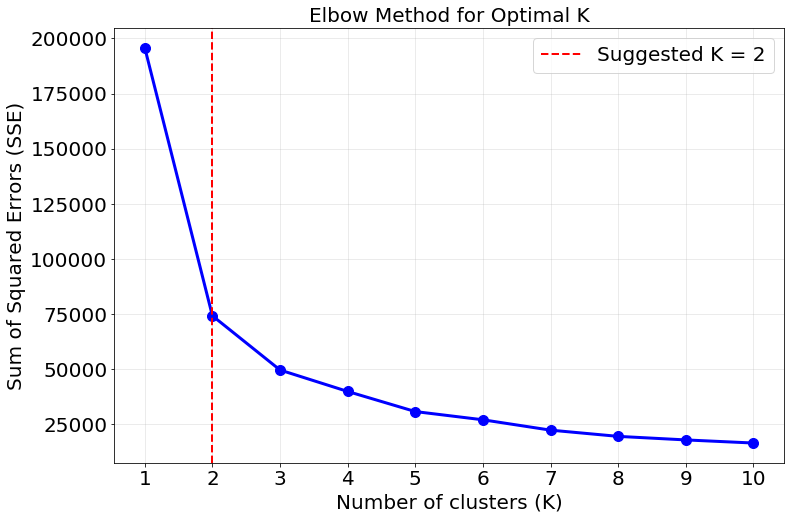

Suggested optimal K (elbow point): 2


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# 1. 定义K值测试范围
k_range = range(1, 11)  # 测试1-10个聚类
sse = []  # 存储SSE

# 2. 计算不同K值的SSE
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(PCA_ds)  # 请确保PCA_ds是已定义的二维数组
    sse.append(kmeans.inertia_)

# 3. 绘制肘部曲线（字号全设为20）
plt.figure(figsize=(12, 8))
plt.plot(k_range, sse, 'bo-', markersize=10, linewidth=3)
plt.xticks(k_range, fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Number of clusters (K)', fontsize=20)
plt.ylabel('Sum of Squared Errors (SSE)', fontsize=20)
# plt.title('Elbow Method for Optimal K', fontsize=20)

# 4. 自动标记肘点
deltas = np.diff(sse) / sse[1:]
elbow_k = np.argmin(deltas) + 2
plt.axvline(x=elbow_k, color='r', linestyle='--', linewidth=2, 
            label=f'Suggested K = {elbow_k}')

# 5. 图例和网格（字号适配）
plt.legend(fontsize=20, framealpha=0.8)
plt.grid(True, alpha=0.3)
plt.tick_params(axis='both', which='major', labelsize=20)  # 坐标轴刻度字号
plt.show()

# 6. 输出建议K值
print(f"Suggested optimal K (elbow point): {elbow_k}")


聚类标签： [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0
 0]
聚类中心： [[-25.12889889   0.11503673  -0.4939649 ]
 [ 32.47426934  -0.14866285   0.63835463]]


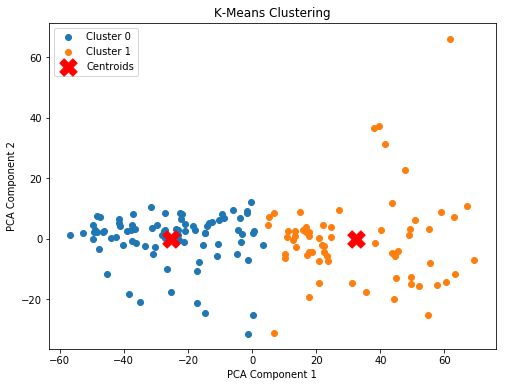

0.5186738594551572
Calinski-Harabasz指数: 241.09404017240166


In [11]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


# 选择聚类的数量 k
# 这里我们假设 k=3，你可以根据实际情况调整
k = 2

# 创建 KMeans 模型
kmeans = KMeans(n_clusters=k)

# 拟合模型
kmeans.fit(PCA_ds)

# 获取聚类结果
labels = kmeans.labels_  # 每个样本的聚类标签
centroids = kmeans.cluster_centers_  # 聚类中心

# 打印聚类结果
print("聚类标签：", labels)
print("聚类中心：", centroids)

# 可视化（仅适用于二维数据，这里我们用 PCA 降维到 2 维进行可视化）
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
data_2d = pca.fit_transform(PCA_ds)

plt.figure(figsize=(8, 6))
for i in range(k):
    plt.scatter(data_2d[labels == i, 0], data_2d[labels == i, 1], label=f'Cluster {i}')
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')
plt.title("K-Means Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()
from sklearn.metrics import silhouette_score
print(silhouette_score(PCA_ds, kmeans.labels_))  # 值越接近1越好‌:ml-citation{ref="3,7" data="citationList"}
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, kmeans.labels_))

In [32]:
# import pandas as pd
# # 转换为DataFrame并保存为CSV
# df = pd.DataFrame({'Label': labels})
# df.to_csv('labels_PCA_KMEANS.csv', index=False)  # 不保存行索引‌:ml-citation{ref="2,4" data="citationList"}


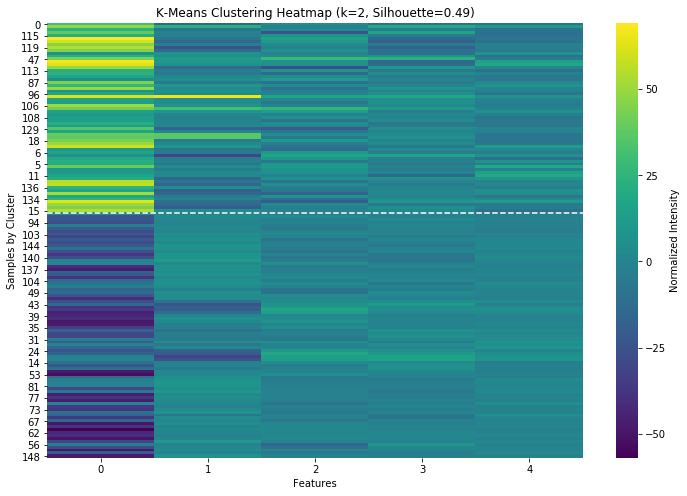

In [81]:
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

# 数据标准化（热力图需要统一量纲）
scaler = MinMaxScaler()
#scaled_data = scaler.fit_transform(PCA_ds)

# 添加聚类标签列
clustered_data = pd.DataFrame(PCA_ds)
clustered_data['Cluster'] = labels  # 添加K-Means聚类标签‌:ml-citation{ref="1,3" data="citationList"}

# 按聚类标签排序
clustered_data.sort_values('Cluster', inplace=True)

# 绘制聚类热力图
plt.figure(figsize=(12, 8))
sns.heatmap(
    clustered_data.drop('Cluster', axis=1),  # 排除标签列
    cmap='viridis',
      # 隐藏样本编号
    cbar_kws={'label': 'Normalized Intensity'}  # 颜色条标签‌:ml-citation{ref="2,6" data="citationList"}
)
plt.title(f'K-Means Clustering Heatmap (k={k}, Silhouette={silhouette_score(PCA_ds, labels):.2f})')
plt.xlabel('Features')
plt.ylabel('Samples by Cluster')
plt.axhline(y=np.sum(labels==0), color='white', linestyle='--')  # 聚类分界线‌:ml-citation{ref="3,7" data="citationList"}
plt.show()


聚类标签： [1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 1 0 0 0 0 1 1 0 0 1 0 0 1 0 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 0 0 1 0 0
 0]
聚类中心： [[-25.12889889   0.11503673  -0.49396488]
 [ 32.47426934  -0.14866285   0.63835461]]
图片已保存至: PCA_kmeans_clustering.jpg


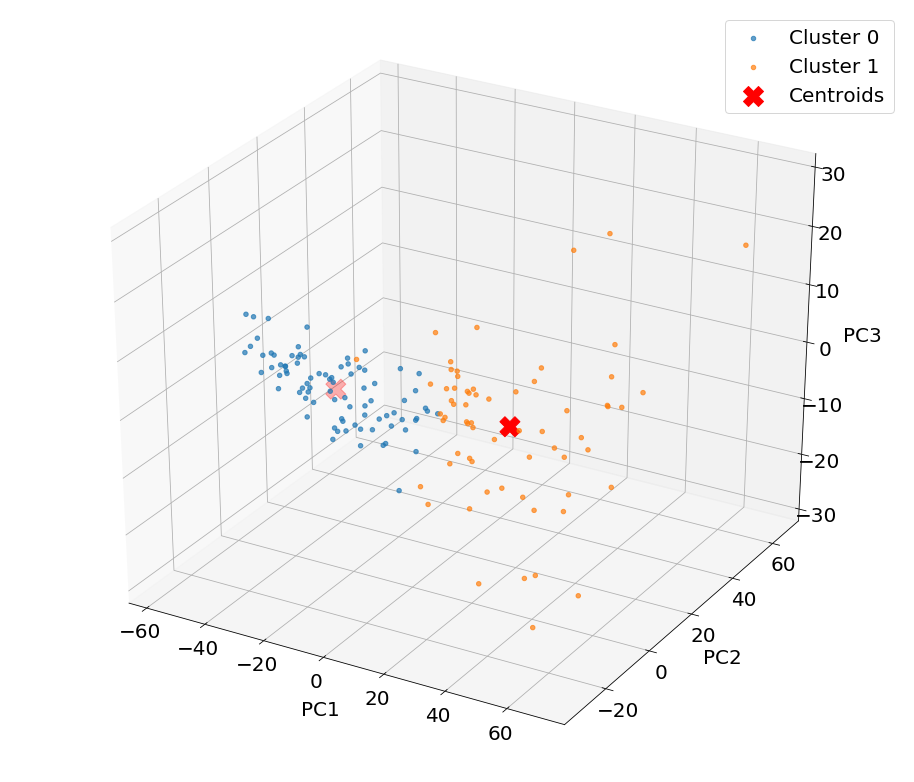

轮廓系数: 0.5186738592872241
Calinski-Harabasz指数: 241.0940401530972


In [10]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# 设置全局字号
plt.rcParams.update({'font.size': 20})

# 选择聚类的数量 k
k = 2 # 假设聚类数目为 2

# 创建 KMeans 模型
kmeans = KMeans(n_clusters=k)

# 拟合模型
kmeans.fit(PCA_ds)  # 假设 PCA_ds 是已经预处理好的数据

# 获取聚类结果
labels = kmeans.labels_  # 每个样本的聚类标签
centroids = kmeans.cluster_centers_  # 聚类中心

# 打印聚类结果
print("聚类标签：", labels)
print("聚类中心：", centroids)

# 使用 PCA 将数据降维到 3 维进行可视化
pca = PCA(n_components=3)
data_3d = pca.fit_transform(PCA_ds)

# 将聚类中心也映射到 3 维空间
centroids_3d = pca.transform(centroids)

# 创建 3D 可视化
fig = plt.figure(figsize=(16, 14))
ax = fig.add_subplot(111, projection='3d')

# 绘制每个聚类的点
for i in range(k):
    ax.scatter(data_3d[labels == i, 0], data_3d[labels == i, 1], data_3d[labels == i, 2],
               label=f'Cluster {i}', alpha=0.7)

# 绘制聚类中心
ax.scatter(centroids_3d[:, 0], centroids_3d[:, 1], centroids_3d[:, 2], 
           s=400, c='red', marker='X', label='Centroids')

# 设置标题和标签（字号已通过全局设置）
ax.set_xlabel("PC1", labelpad=15)
ax.set_ylabel("PC2", labelpad=15)
ax.set_zlabel("PC3", labelpad=15)
ax.legend()

# 保存图片
save_path = "PCA_kmeans_clustering.jpg"
plt.savefig(save_path, dpi=600, bbox_inches='tight')
print(f"图片已保存至: {save_path}")

plt.show()

# 计算轮廓系数
print("轮廓系数:", silhouette_score(PCA_ds, kmeans.labels_))
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, kmeans.labels_))


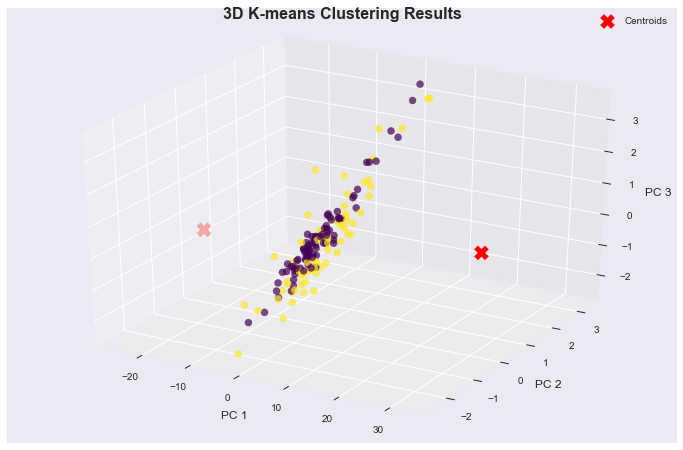

轮廓系数: 0.418190989799109
Calinski-Harabasz指数: 150.2458826668899


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from mpl_toolkits.mplot3d import Axes3D



# K-means聚类
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(PCA_ds)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# 三维可视化
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# 绘制数据点
scatter = ax.scatter(data[:, 0], data[:, 1], data[:, 2], 
                    c=labels, cmap='viridis', s=50, alpha=0.7)

# 绘制聚类中心
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2],
          c='red', marker='X', s=200, label='Centroids')

# # 设置图表属性
# ax.set_title('3D K-means Clustering Results')
# ax.set_xlabel('Feature 1')
# ax.set_ylabel('Feature 2')
# ax.set_zlabel('Feature 3')
# 美化图表属性
ax.set_title('3D K-means Clustering Results\n', fontsize=16, fontweight='bold')
ax.set_xlabel('PC 1', fontsize=12, labelpad=10)
ax.set_ylabel('PC 2', fontsize=12, labelpad=10)
ax.set_zlabel('PC 3', fontsize=12, labelpad=10)

ax.legend()
ax.grid(True)
plt.savefig('3D K-means Clustering Results', dpi=600, bbox_inches='tight', facecolor=fig.get_facecolor())
# print("\n图片已保存为: 3d_kmeans_clustering.jpg")
plt.show()

# 输出评估指标
print("轮廓系数:", silhouette_score(data, kmeans.labels_))  # 值越接近1越好
print("Calinski-Harabasz指数:", calinski_harabasz_score(data, kmeans.labels_))


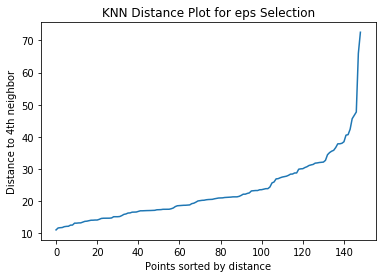

In [83]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(data,labels)
distances, indices = nbrs.kneighbors(data)

# 获取每个点到第 4 个最近邻居的距离
distances = distances[:, -1]
distances = np.sort(distances, axis=0)

# 绘制 KNN 距离图
plt.plot(distances)
plt.xlabel('Points sorted by distance')
plt.ylabel('Distance to 4th neighbor')
plt.title('KNN Distance Plot for eps Selection')
plt.show()

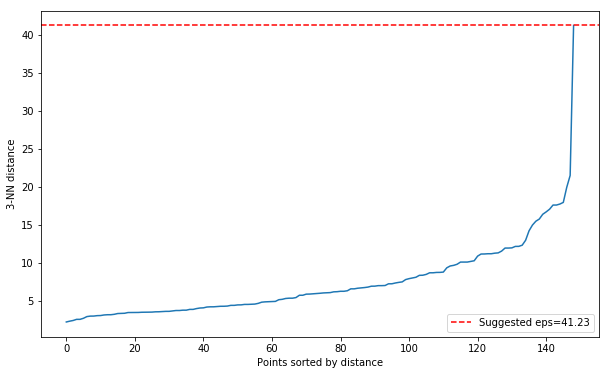

In [21]:
from sklearn.neighbors import NearestNeighbors

def find_dbscan_eps(data, min_pts):
    """
    通过k-距离图确定DBSCAN的eps参数
    :param data: 输入数据（需预先标准化）
    :param min_pts: 最小邻域点数（通常取维度+1）
    :return: 建议的eps值
    """
    neigh = NearestNeighbors(n_neighbors=min_pts)
    neigh.fit(PCA_ds)
    distances, _ = neigh.kneighbors(PCA_ds)
    k_distances = np.sort(distances[:, -1])
    
    # 自动检测拐点（最大曲率点）
    gradients = np.gradient(k_distances)
    elbow_idx = np.argmax(gradients)
    eps = k_distances[elbow_idx]
    
    # 可视化
    plt.figure(figsize=(10,6))
    plt.plot(k_distances)
    plt.axhline(y=eps, color='r', linestyle='--', 
                label=f'Suggested eps={eps:.2f}')
    plt.xlabel('Points sorted by distance')
    plt.ylabel(f'{min_pts}-NN distance')
    plt.legend()
    plt.show()
    
    return eps

# 使用示例
eps = find_dbscan_eps(PCA_ds, min_pts=3)  # 输出建议eps值


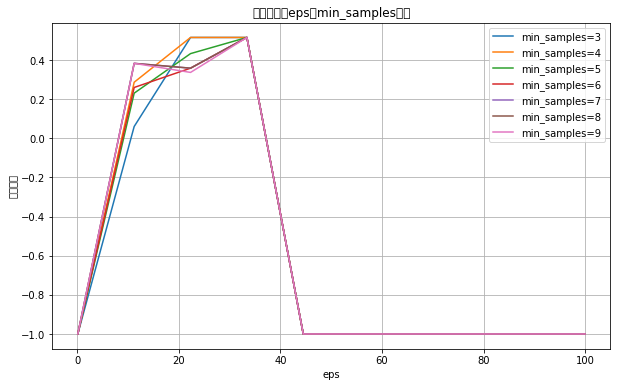

最佳eps: 22.300000000000004, 最佳min_samples: 3.0, 最佳轮廓系数: 0.5150653960847567


In [12]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 假设拉曼光谱数据已经预处理并存储在变量data中
# data = ...

# 标准化数据
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# 定义eps和min_samples的范围
eps_range = np.linspace(0.1, 100, 10)
min_samples_range = range(3, 10)

# 存储每个eps和min_samples组合对应的轮廓系数
results = []

# 网格搜索
for eps in eps_range:
    for min_samples in min_samples_range:
        # DBSCAN聚类
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(PCA_ds)
        
        # 计算轮廓系数
        if len(set(labels)) > 1:
            score = silhouette_score(PCA_ds, labels)
            results.append((eps, min_samples, score))
        else:
            results.append((eps, min_samples, -1))  # 如果只有一个簇，轮廓系数设为-1

# 转换为numpy数组以便于处理
results = np.array(results)

# 绘制轮廓系数随eps变化的图
plt.figure(figsize=(10, 6))
for min_samples in min_samples_range:
    # 筛选出特定min_samples对应的eps和轮廓系数
    filtered_results = results[results[:, 1] == min_samples]
    plt.plot(filtered_results[:, 0], filtered_results[:, 2], label=f'min_samples={min_samples}')

plt.xlabel('eps')
plt.ylabel('轮廓系数')
plt.title('轮廓系数随eps和min_samples变化')
plt.legend()
plt.grid(True)
plt.show()

# 找出最佳的eps和min_samples组合
best_index = np.argmax(results[:, 2])
best_eps, best_min_samples, best_score = results[best_index]
print(f'最佳eps: {best_eps}, 最佳min_samples: {best_min_samples}, 最佳轮廓系数: {best_score}')

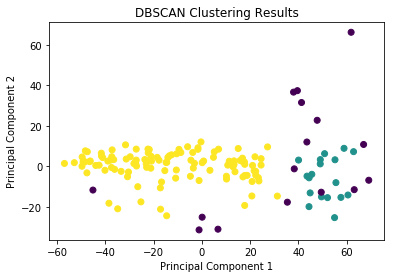

轮廓系数：0.3615
Calinski-Harabasz指数: 57.528469530142445


In [154]:
# 导入必要的库
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
# 应用DBSCAN聚类
dbscan = DBSCAN(eps=13.7, min_samples=5)
clusters = dbscan.fit_predict(PCA_ds)

# 可视化聚类结果
#plt.scatter(PCA_ds[:, 0], PCA_ds[:, 1], c=clusters, cmap='viridis', marker='o')
plt.scatter(PCA_ds.iloc[:, 0], PCA_ds.iloc[:, 1], c=clusters, cmap='viridis', marker='o')

plt.title('DBSCAN Clustering Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()
from sklearn.metrics import silhouette_score

# X为数据集，labels为聚类结果
score = silhouette_score(PCA_ds,clusters)
print('轮廓系数：%.4f' % score)
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, clusters))

聚类标签： [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 1 1 1 1 0 0 1 0 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 0 1 1 0 0 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 0 1 1 0 1 1 0 1 1 1 1 1 0 1 1 0 1 1 0 1 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 0 1 1 1 0 0 0 0 1 1 1 1 1 1 1 1 0 1 1
 1]


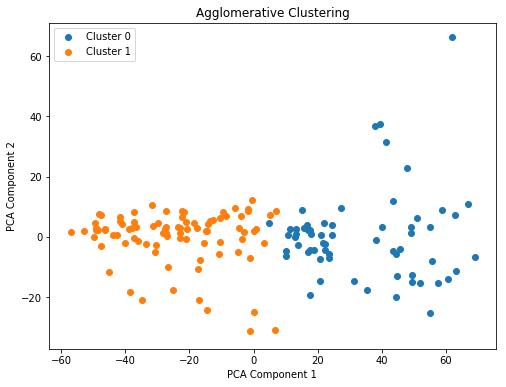

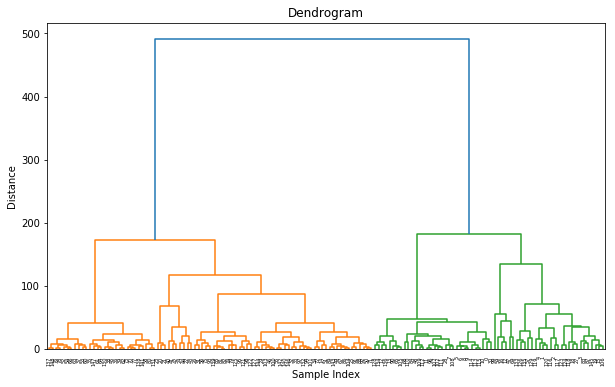

轮廓系数: 0.5162771124661781
Calinski-Harabasz指数: 237.36576023441341


In [33]:
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA



# 选择聚类的数量
# 这里我们假设 k=3，你可以根据实际情况调整
k = 2

# 创建层次聚类模型
agglo = AgglomerativeClustering(n_clusters=k, linkage='ward')

# 拟合模型
agglo.fit(PCA_ds)

# 获取聚类结果
labels = agglo.labels_  # 每个样本的聚类标签

# 打印聚类结果
print("聚类标签：", labels)

# 可视化聚类结果（使用PCA降维到2维）
pca = PCA(n_components=2)
data_2d = pca.fit_transform(PCA_ds)

plt.figure(figsize=(8, 6))
for i in range(k):
    plt.scatter(data_2d[labels == i, 0], data_2d[labels == i, 1], label=f'Cluster {i}')
plt.title("Agglomerative Clustering")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.show()

# 绘制层次聚类的树状图（Dendrogram）
plt.figure(figsize=(10, 6))
dendrogram(linkage(PCA_ds, method='ward'))
plt.title("Dendrogram")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()
# 计算轮廓系数
print("轮廓系数:", silhouette_score(PCA_ds,labels))
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, labels))

In [149]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

# 生成一些数据

# 创建并拟合GMM模型
gmm = GaussianMixture(n_components=4, covariance_type='full')
gmm.fit(PCA_ds)

# 预测每个样本的类别
labels = gmm.predict(PCA_ds)




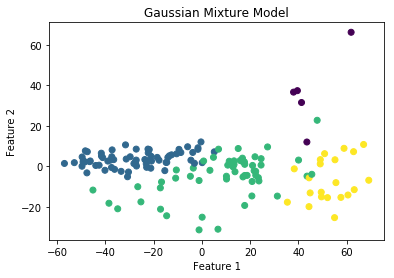

轮廓系数: 0.3609791640609043
Calinski-Harabasz指数: 110.79422702146161


In [150]:
# 绘制结果
plt.scatter(PCA_ds[0], PCA_ds[1], c=labels, cmap='viridis', marker='o')
plt.title('Gaussian Mixture Model')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()
print("轮廓系数:", silhouette_score(PCA_ds,labels))
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, labels))

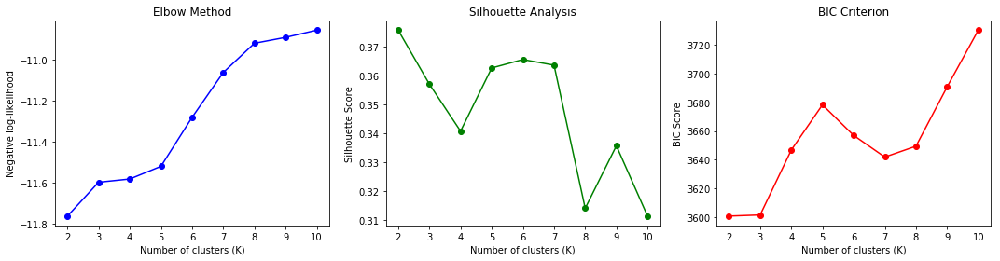

Best K based on BIC: 2


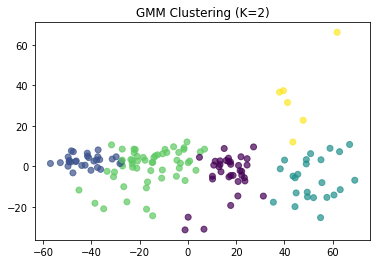

轮廓系数: 0.3625841632007721
Calinski-Harabasz指数: 171.6264426469663


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler


# 定义K值搜索范围
K_range = range(2, 11)

# 方法1：肘部法则（基于inertia_）
inertias = []
for k in K_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(PCA_ds)
    inertias.append(gmm.lower_bound_)  # 负对数似然（越小越好）

plt.figure(figsize=(15, 4))
plt.subplot(131)
plt.plot(K_range, inertias, 'bo-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Negative log-likelihood')
plt.title('Elbow Method')

# 方法2：轮廓系数
silhouette_scores = []
for k in K_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    labels = gmm.fit_predict(PCA_ds)
    if len(np.unique(labels)) < 2:  # 至少需要2个聚类才能计算
        silhouette_scores.append(-1)
    else:
        silhouette_scores.append(silhouette_score(PCA_ds, labels))

plt.subplot(132)
plt.plot(K_range, silhouette_scores, 'go-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Analysis')

# 方法3：BIC准则（越小越好）
bic_scores = []
for k in K_range:
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(PCA_ds)
    bic_scores.append(gmm.bic(PCA_ds))

plt.subplot(133)
plt.plot(K_range, bic_scores, 'ro-')
plt.xlabel('Number of clusters (K)')
plt.ylabel('BIC Score')
plt.title('BIC Criterion')

plt.tight_layout()
plt.show()

# 自动选择最佳K值（以BIC为例）
best_k = K_range[np.argmin(bic_scores)]
print(f"Best K based on BIC: {best_k}")

# 用最佳K值训练最终模型
best_gmm = GaussianMixture(n_components=5, random_state=42)
best_gmm.fit(PCA_ds)
labels = best_gmm.predict(PCA_ds)

# 可视化聚类结果
plt.scatter(PCA_ds[0], PCA_ds[1], c=labels, cmap='viridis', alpha=0.7)
plt.title(f'GMM Clustering (K={best_k})')
plt.show()
print("轮廓系数:", silhouette_score(PCA_ds,labels))
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, labels))

轮廓系数: 0.5154328261775307
Calinski-Harabasz指数: 238.48706053126602


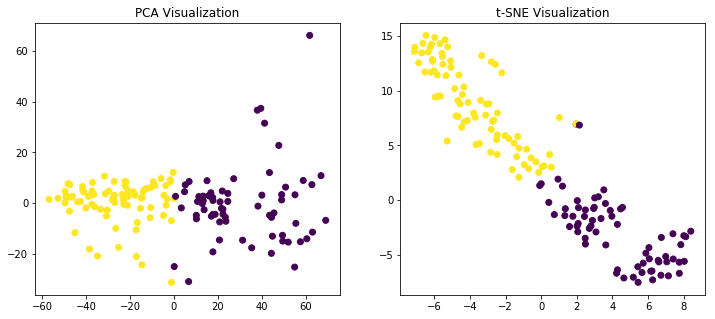

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import SpectralClustering
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.manifold import TSNE
# ----------------------
# 谱聚类
# ----------------------
n_clusters = 2  # 根据实际情况调整（可通过肘部法则确定）

model = SpectralClustering(
    n_clusters=n_clusters,
    affinity='nearest_neighbors',          # 高斯核函数
    gamma=1,               # 核参数，需优化
    assign_labels='discretize',  # 对特征向量进行kmeans
    random_state=42
)

labels = model.fit_predict(PCA_ds)

# ----------------------
# 评估与可视化
# ----------------------
# 1. 评估指标（无监督）
print("轮廓系数:", silhouette_score(PCA_ds, labels))
print("Calinski-Harabasz指数:", calinski_harabasz_score(PCA_ds, labels))

# 2. 可视化（使用PCA/t-SNE）
plt.figure(figsize=(12, 5))

# PCA 2D投影
plt.subplot(121)
pca_vis = PCA(n_components=2)
X_pca_vis = pca_vis.fit_transform(PCA_ds)
plt.scatter(X_pca_vis[:, 0], X_pca_vis[:, 1], c=labels, cmap='viridis')
plt.title("PCA Visualization")

# t-SNE 2D投影
plt.subplot(122)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(PCA_ds)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='viridis')
plt.title("t-SNE Visualization")

plt.show()


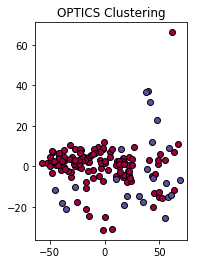

In [47]:
# 聚类结果
plt.subplot(122)
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        col = (0, 0, 0, 1)  # 黑色表示噪声
    class_member_mask = (labels == k)
    xy =PCA_ds[class_member_mask]
    plt.plot(xy[0], xy[1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)
plt.title('OPTICS Clustering')
plt.show()